In [124]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.impute import SimpleImputer
%matplotlib inline
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import scale
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error as MSE
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.ensemble import AdaBoostRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.pipeline import make_pipeline
import warnings
warnings.filterwarnings('ignore')

In [2]:
pip install hvplot

Note: you may need to restart the kernel to use updated packages.


In [3]:
import hvplot.pandas  

In [4]:
df=pd.read_csv("C:\\Users\\srivi\\Downloads\\Supply Chain Project\\Data.csv")

In [5]:
df.head()

,Ware_house_ID,WH_Manager_ID,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,...,electric_supply,dist_from_hub,workers_num,wh_est_year,storage_issue_reported_l3m,temp_reg_mach,approved_wh_govt_certificate,wh_breakdown_l3m,govt_check_l3m,product_wg_ton
0,WH_100000,EID_50000,Urban,Small,West,Zone 6,3,1,2,4651,...,1,91,29.0,NaN,13,0,A,5,15,17115
1,WH_100001,EID_50001,Rural,Large,North,Zone 5,0,0,4,6217,...,1,210,31.0,NaN,4,0,A,3,17,5074
2,WH_100002,EID_50002,Rural,Mid,South,Zone 2,1,0,4,4306,...,0,161,37.0,NaN,17,0,A,6,22,23137
3,WH_100003,EID_50003,Rural,Mid,North,Zone 3,7,4,2,6000,...,0,103,21.0,NaN,17,1,A+,3,27,22115
4,WH_100004,EID_50004,Rural,Large,North,Zone 5,3,1,2,4740,...,1,112,25.0,2009.0,18,0,C,6,24,24071


In [6]:
df.tail()

,Ware_house_ID,WH_Manager_ID,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,...,electric_supply,dist_from_hub,workers_num,wh_est_year,storage_issue_reported_l3m,temp_reg_mach,approved_wh_govt_certificate,wh_breakdown_l3m,govt_check_l3m,product_wg_ton
24995,WH_124995,EID_74995,Rural,Small,North,Zone 1,3,0,4,5390,...,1,142,34.0,2005.0,22,1,A,2,30,32093
24996,WH_124996,EID_74996,Rural,Mid,West,Zone 2,6,0,4,4490,...,1,130,28.0,2012.0,10,0,B,4,18,12114
24997,WH_124997,EID_74997,Urban,Large,South,Zone 5,7,0,2,5403,...,1,147,NaN,NaN,23,0,B+,5,25,27080
24998,WH_124998,EID_74998,Rural,Small,North,Zone 1,1,0,2,10562,...,1,60,25.0,NaN,18,0,A,6,30,25093
24999,WH_124999,EID_74999,Rural,Mid,West,Zone 4,8,2,4,5664,...,1,239,39.0,2019.0,4,0,B+,2,11,5058


In [7]:
df.shape

(25000, 24)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 24 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Ware_house_ID                 25000 non-null  object 
 1   WH_Manager_ID                 25000 non-null  object 
 2   Location_type                 25000 non-null  object 
 3   WH_capacity_size              25000 non-null  object 
 4   zone                          25000 non-null  object 
 5   WH_regional_zone              25000 non-null  object 
 6   num_refill_req_l3m            25000 non-null  int64  
 7   transport_issue_l1y           25000 non-null  int64  
 8   Competitor_in_mkt             25000 non-null  int64  
 9   retail_shop_num               25000 non-null  int64  
 10  wh_owner_type                 25000 non-null  object 
 11  distributor_num               25000 non-null  int64  
 12  flood_impacted                25000 non-null  int64  
 13  f

In [9]:
df.isnull().sum()

Ware_house_ID                       0
WH_Manager_ID                       0
Location_type                       0
WH_capacity_size                    0
zone                                0
WH_regional_zone                    0
num_refill_req_l3m                  0
transport_issue_l1y                 0
Competitor_in_mkt                   0
retail_shop_num                     0
wh_owner_type                       0
distributor_num                     0
flood_impacted                      0
flood_proof                         0
electric_supply                     0
dist_from_hub                       0
workers_num                       990
wh_est_year                     11881
storage_issue_reported_l3m          0
temp_reg_mach                       0
approved_wh_govt_certificate      908
wh_breakdown_l3m                    0
govt_check_l3m                      0
product_wg_ton                      0
dtype: int64

In [10]:
df.describe()

,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,distributor_num,flood_impacted,flood_proof,electric_supply,dist_from_hub,workers_num,wh_est_year,storage_issue_reported_l3m,temp_reg_mach,wh_breakdown_l3m,govt_check_l3m,product_wg_ton
count,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000,24010.000000,13119.000000,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000
mean,4.089040,0.773680,3.104200,4985.711560,42.418120,0.098160,0.054640,0.656880,163.537320,28.944398,2009.383185,17.130440,0.303280,3.482040,18.812280,22102.632920
std,2.606612,1.199449,1.141663,1052.825252,16.064329,0.297537,0.227281,0.474761,62.718609,7.872534,7.528230,9.161108,0.459684,1.690335,8.632382,11607.755077
min,0.000000,0.000000,0.000000,1821.000000,15.000000,0.000000,0.000000,0.000000,55.000000,10.000000,1996.000000,0.000000,0.000000,0.000000,1.000000,2065.000000
25%,2.000000,0.000000,2.000000,4313.000000,29.000000,0.000000,0.000000,0.000000,109.000000,24.000000,2003.000000,10.000000,0.000000,2.000000,11.000000,13059.000000
50%,4.000000,0.000000,3.000000,4859.000000,42.000000,0.000000,0.000000,1.000000,164.000000,28.000000,2009.000000,18.000000,0.000000,3.000000,21.000000,22101.000000
75%,6.000000,1.000000,4.000000,5500.000000,56.000000,0.000000,0.000000,1.000000,218.000000,33.000000,2016.000000,24.000000,1.000000,5.000000,26.000000,30103.000000
max,8.000000,5.000000,12.000000,11008.000000,70.000000,1.000000,1.000000,1.000000,271.000000,98.000000,2023.000000,39.000000,1.000000,6.000000,32.000000,55151.000000


In [11]:
dups = df.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))
print(df.shape)

Number of duplicate rows = 0
(25000, 24)


In [12]:
df.columns

Index(['Ware_house_ID', 'WH_Manager_ID', 'Location_type', 'WH_capacity_size',
       'zone', 'WH_regional_zone', 'num_refill_req_l3m', 'transport_issue_l1y',
       'Competitor_in_mkt', 'retail_shop_num', 'wh_owner_type',
       'distributor_num', 'flood_impacted', 'flood_proof', 'electric_supply',
       'dist_from_hub', 'workers_num', 'wh_est_year',
       'storage_issue_reported_l3m', 'temp_reg_mach',
       'approved_wh_govt_certificate', 'wh_breakdown_l3m', 'govt_check_l3m',
       'product_wg_ton'],
      dtype='object')

In [13]:
cat=[]
num=[]
for i in df.columns:
    if df[i].dtype=="object":
        cat.append(i)
    else:
        num.append(i)
print(cat) 
print(num)

['Ware_house_ID', 'WH_Manager_ID', 'Location_type', 'WH_capacity_size', 'zone', 'WH_regional_zone', 'wh_owner_type', 'approved_wh_govt_certificate']
['num_refill_req_l3m', 'transport_issue_l1y', 'Competitor_in_mkt', 'retail_shop_num', 'distributor_num', 'flood_impacted', 'flood_proof', 'electric_supply', 'dist_from_hub', 'workers_num', 'wh_est_year', 'storage_issue_reported_l3m', 'temp_reg_mach', 'wh_breakdown_l3m', 'govt_check_l3m', 'product_wg_ton']


In [14]:
df.drop('WH_Manager_ID',axis=1)

,Ware_house_ID,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,wh_owner_type,...,electric_supply,dist_from_hub,workers_num,wh_est_year,storage_issue_reported_l3m,temp_reg_mach,approved_wh_govt_certificate,wh_breakdown_l3m,govt_check_l3m,product_wg_ton
0,WH_100000,Urban,Small,West,Zone 6,3,1,2,4651,Rented,...,1,91,29.0,NaN,13,0,A,5,15,17115
1,WH_100001,Rural,Large,North,Zone 5,0,0,4,6217,Company Owned,...,1,210,31.0,NaN,4,0,A,3,17,5074
2,WH_100002,Rural,Mid,South,Zone 2,1,0,4,4306,Company Owned,...,0,161,37.0,NaN,17,0,A,6,22,23137
3,WH_100003,Rural,Mid,North,Zone 3,7,4,2,6000,Rented,...,0,103,21.0,NaN,17,1,A+,3,27,22115
4,WH_100004,Rural,Large,North,Zone 5,3,1,2,4740,Company Owned,...,1,112,25.0,2009.0,18,0,C,6,24,24071
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24995,WH_124995,Rural,Small,North,Zone 1,3,0,4,5390,Rented,...,1,142,34.0,2005.0,22,1,A,2,30,32093
24996,WH_124996,Rural,Mid,West,Zone 2,6,0,4,4490,Company Owned,...,1,130,28.0,2012.0,10,0,B,4,18,12114
24997,WH_124997,Urban,Large,South,Zone 5,7,0,2,5403,Rented,...,1,147,NaN,NaN,23,0,B+,5,25,27080
24998,WH_124998,Rural,Small,North,Zone 1,1,0,2,10562,Rented,...,1,60,25.0,NaN,18,0,A,6,30,25093


In [15]:
df['Location_type'].value_counts()

Rural    22957
Urban     2043
Name: Location_type, dtype: int64

In [16]:
df['WH_capacity_size'].value_counts()

Large    10169
Mid      10020
Small     4811
Name: WH_capacity_size, dtype: int64

In [17]:
df['zone'].value_counts()

North    10278
West      7931
South     6362
East       429
Name: zone, dtype: int64

In [18]:
df['wh_owner_type'].value_counts()

Company Owned    13578
Rented           11422
Name: wh_owner_type, dtype: int64

In [19]:
df['approved_wh_govt_certificate'].value_counts()

C     5501
B+    4917
B     4812
A     4671
A+    4191
Name: approved_wh_govt_certificate, dtype: int64

<AxesSubplot:>

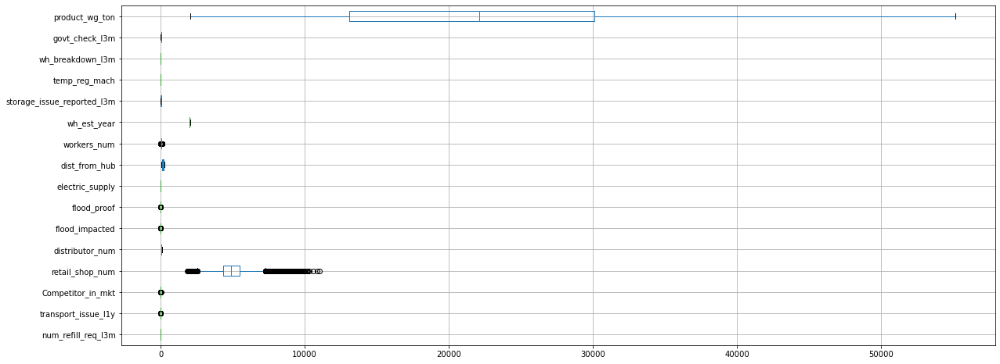

In [20]:
plt.figure(figsize=(20,8))
df.boxplot(vert=0)

(array([0, 1]), [Text(0, 0, 'Company Owned'), Text(1, 0, 'Rented')])

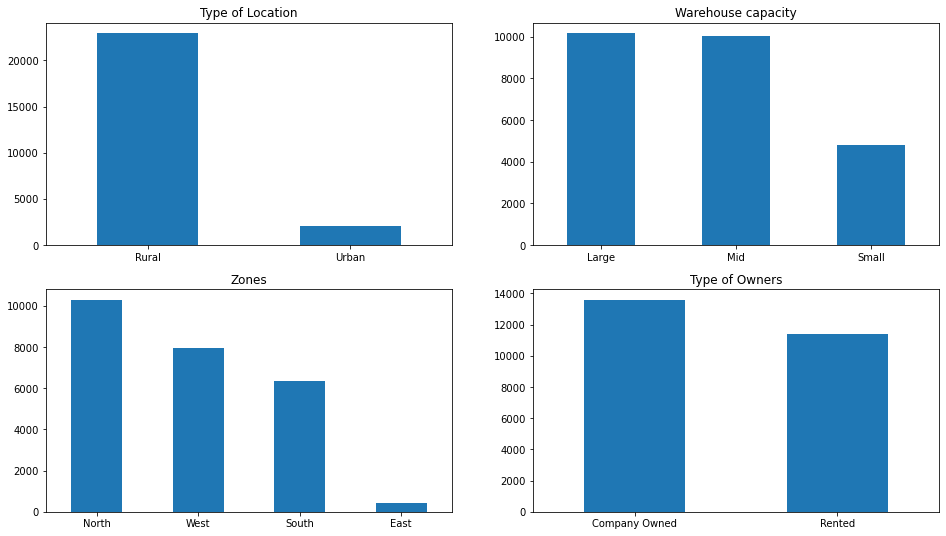

In [21]:
plt.subplot(221)

df['Location_type'].value_counts().plot(kind='bar', title='Type of Location', figsize=(16,9))

plt.xticks(rotation=0)

plt.subplot(222)

df['WH_capacity_size'].value_counts().plot(kind='bar', title='Warehouse capacity')

plt.xticks(rotation=0)

plt.subplot(223)

df['zone'].value_counts().plot(kind='bar', title='Zones')

plt.xticks(rotation=0)

plt.subplot(224)

df['wh_owner_type'].value_counts().plot(kind='bar', title='Type of Owners')

plt.xticks(rotation=0)



(array([0, 1, 2, 3, 4]),
 [Text(0, 0, 'C'),
  Text(1, 0, 'B+'),
  Text(2, 0, 'B'),
  Text(3, 0, 'A'),
  Text(4, 0, 'A+')])

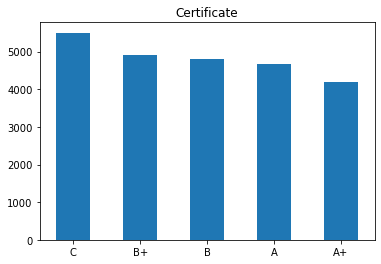

In [22]:
plt.subplot()

df['approved_wh_govt_certificate'].value_counts().plot(kind='bar', title='Certificate')

plt.xticks(rotation=0)

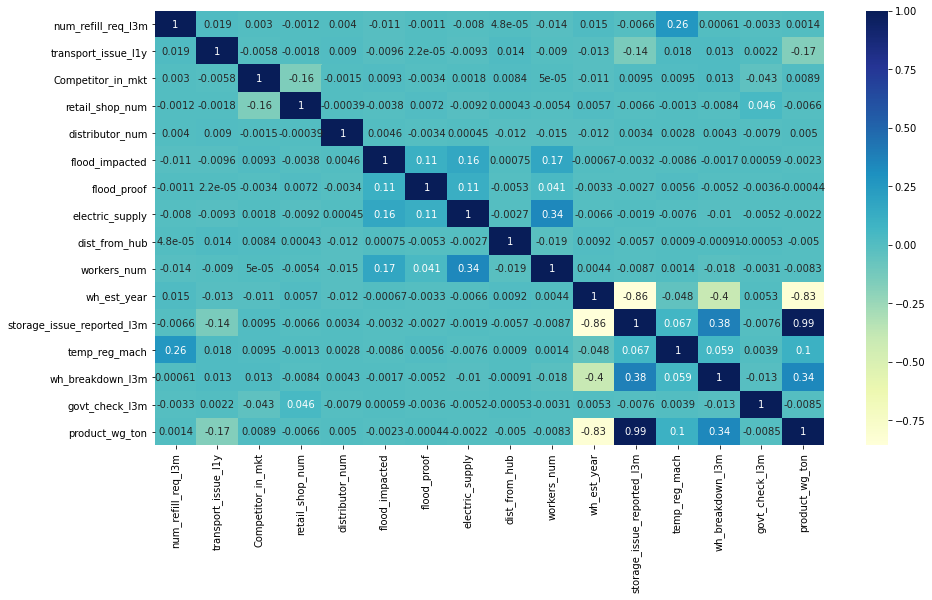

In [23]:
plt.figure(figsize=(15,8))
sns.heatmap(df.corr(),annot=True,cmap='YlGnBu')
plt.show()

In [24]:
df.dropna(subset=['wh_est_year'], inplace=True)

In [25]:
df.dropna(subset=['approved_wh_govt_certificate'], inplace=True)

In [26]:
df.isnull().sum()

Ware_house_ID                     0
WH_Manager_ID                     0
Location_type                     0
WH_capacity_size                  0
zone                              0
WH_regional_zone                  0
num_refill_req_l3m                0
transport_issue_l1y               0
Competitor_in_mkt                 0
retail_shop_num                   0
wh_owner_type                     0
distributor_num                   0
flood_impacted                    0
flood_proof                       0
electric_supply                   0
dist_from_hub                     0
workers_num                     519
wh_est_year                       0
storage_issue_reported_l3m        0
temp_reg_mach                     0
approved_wh_govt_certificate      0
wh_breakdown_l3m                  0
govt_check_l3m                    0
product_wg_ton                    0
dtype: int64

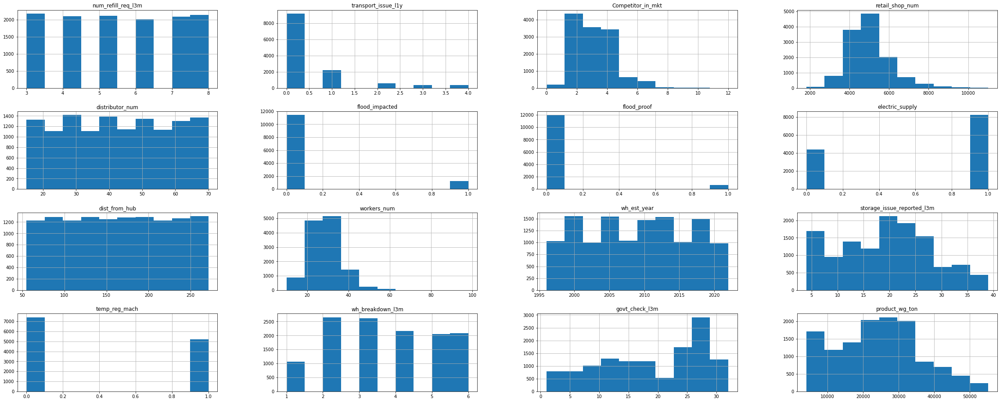

In [105]:
df.hist(figsize=(40,16));

<Figure size 1440x576 with 0 Axes>

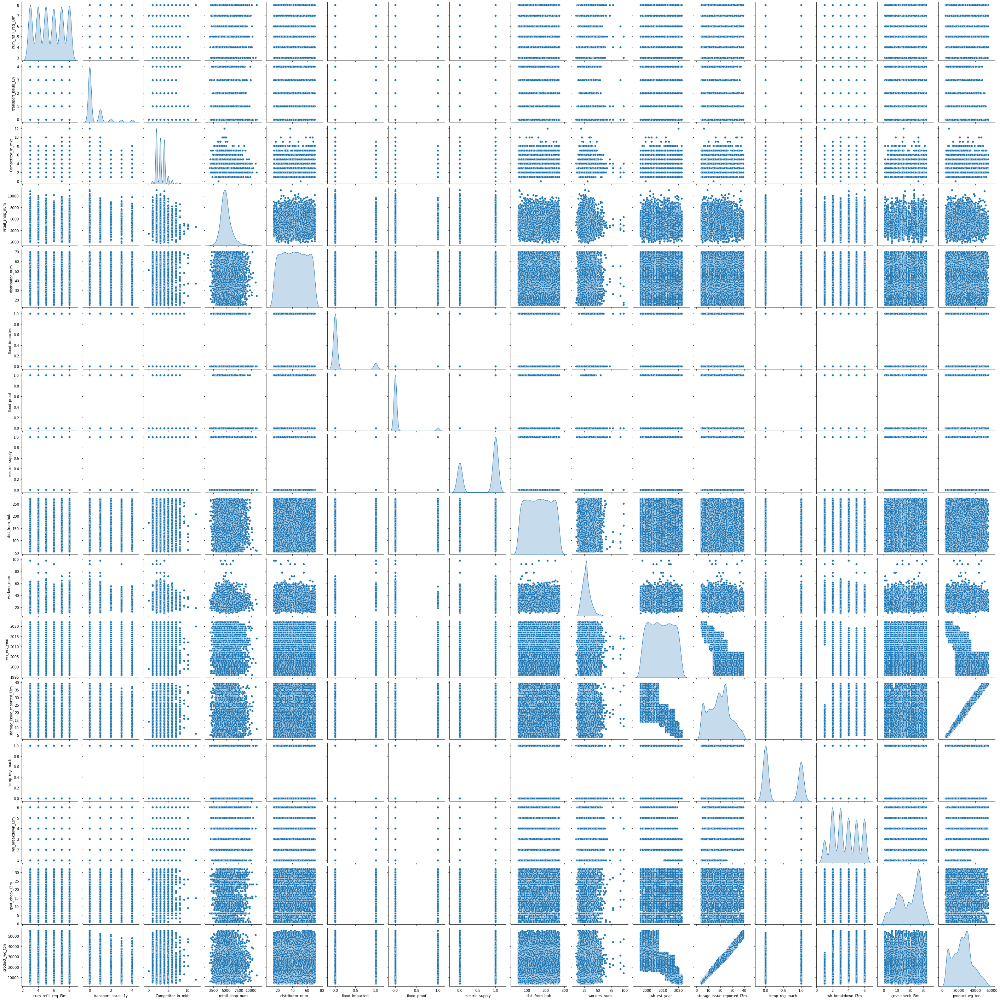

In [164]:
plt.figure(figsize=(20, 8))
sns.pairplot(df,diag_kind='kde')

<AxesSubplot:xlabel='zone', ylabel='count'>

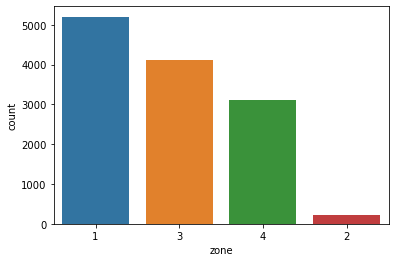

In [103]:
sns.countplot(df.zone)

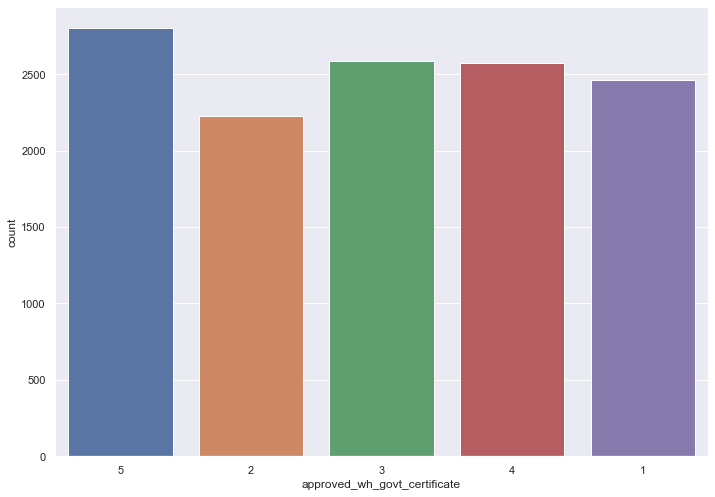

In [184]:
sns.countplot(df.approved_wh_govt_certificate)
sns.set(rc={'figure.figsize':(11.7,8.27)})

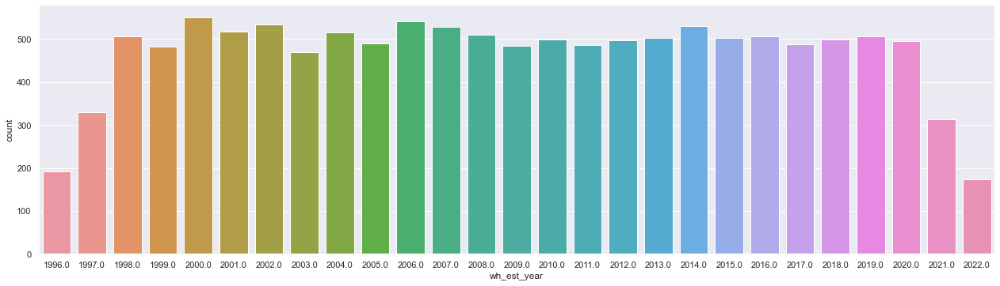

In [189]:
sns.catplot('wh_est_year', data=df, kind='count',aspect=3.5)

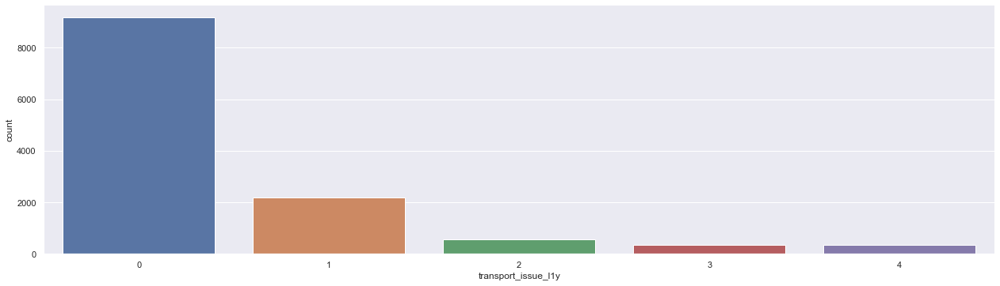

In [192]:
sns.catplot('transport_issue_l1y', data=df, kind='count',aspect=3.5)

<AxesSubplot:xlabel='transport_issue_l1y', ylabel='count'>

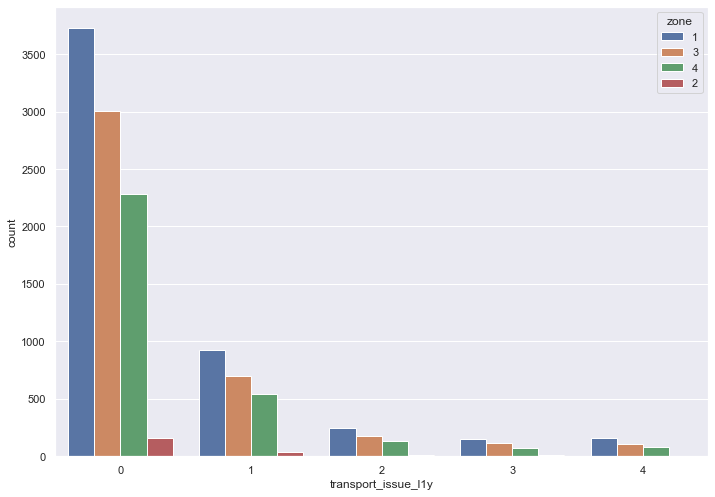

In [196]:
sns.countplot(x='transport_issue_l1y',hue='zone', data=df)

<AxesSubplot:xlabel='transport_issue_l1y', ylabel='count'>

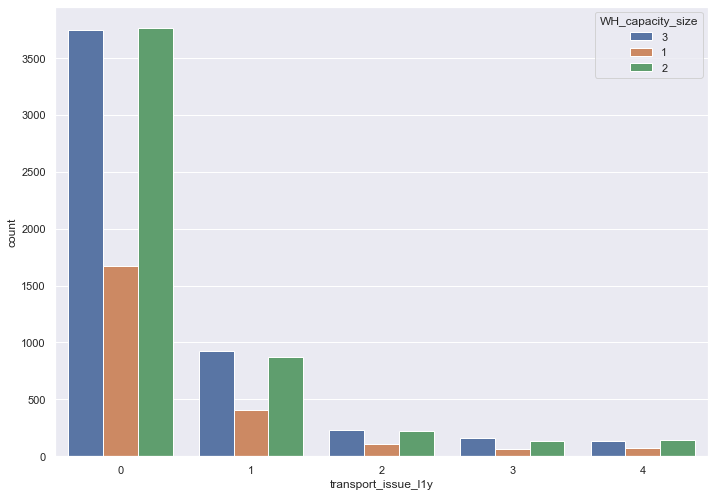

In [197]:
sns.countplot(x='transport_issue_l1y',hue='WH_capacity_size', data=df)

<AxesSubplot:xlabel='approved_wh_govt_certificate', ylabel='count'>

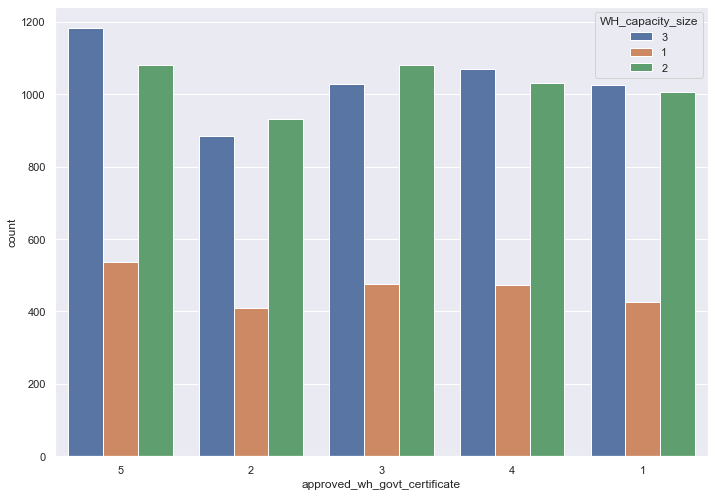

In [198]:
sns.countplot(x='approved_wh_govt_certificate',hue='WH_capacity_size', data=df)

<AxesSubplot:xlabel='transport_issue_l1y', ylabel='count'>

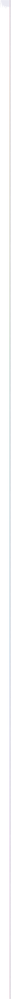

In [200]:
sns.countplot(x='transport_issue_l1y',hue='retail_shop_num', data=df)

In [30]:
df.corr()

,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,distributor_num,flood_impacted,flood_proof,electric_supply,dist_from_hub,workers_num,wh_est_year,storage_issue_reported_l3m,temp_reg_mach,wh_breakdown_l3m,govt_check_l3m,product_wg_ton
num_refill_req_l3m,1.000000,-0.004610,0.007754,-0.001961,0.004925,0.012572,0.004880,0.009185,-0.006415,-0.000152,0.019020,-0.019543,-0.004934,-0.018082,-0.001997,-0.020175
transport_issue_l1y,-0.004610,1.000000,-0.016774,-0.013579,-0.004233,0.001601,-0.007392,-0.011640,-0.003899,-0.006421,0.002992,-0.069691,0.015205,0.011247,0.003245,-0.091708
Competitor_in_mkt,0.007754,-0.016774,1.000000,-0.160908,-0.001791,0.011556,-0.013348,-0.008173,0.012391,-0.007298,-0.006335,0.009248,0.012212,0.013425,-0.042501,0.009365
retail_shop_num,-0.001961,-0.013579,-0.160908,1.000000,0.001226,-0.008714,-0.003490,-0.001968,0.002129,0.004454,0.004426,-0.003486,0.005146,-0.001564,0.047620,-0.002653
distributor_num,0.004925,-0.004233,-0.001791,0.001226,1.000000,0.001124,0.003757,0.013230,-0.010050,-0.021283,-0.011128,0.011596,-0.001568,0.002868,-0.006918,0.012637
flood_impacted,0.012572,0.001601,0.011556,-0.008714,0.001124,1.000000,0.111723,0.170051,-0.004051,0.173202,-0.003322,0.000207,-0.004914,-0.002962,0.005253,0.000593
flood_proof,0.004880,-0.007392,-0.013348,-0.003490,0.003757,0.111723,1.000000,0.105423,0.008520,0.041137,-0.005692,0.009875,0.016644,-0.000642,-0.008063,0.013825
electric_supply,0.009185,-0.011640,-0.008173,-0.001968,0.013230,0.170051,0.105423,1.000000,-0.002817,0.346018,-0.006327,0.007957,-0.002370,-0.000263,-0.002287,0.008589
dist_from_hub,-0.006415,-0.003899,0.012391,0.002129,-0.010050,-0.004051,0.008520,-0.002817,1.000000,-0.010481,0.005457,-0.006240,0.009010,0.004410,0.008459,-0.004640
workers_num,-0.000152,-0.006421,-0.007298,0.004454,-0.021283,0.173202,0.041137,0.346018,-0.010481,1.000000,0.004376,-0.000838,0.001556,-0.018630,-0.003860,-0.000371


C:\Users\srivi\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='num_refill_req_l3m', ylabel='Competitor_in_mkt'>

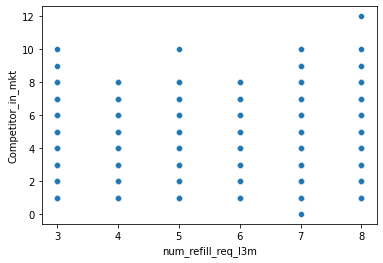

In [31]:
sns.scatterplot(df.num_refill_req_l3m,df.Competitor_in_mkt)

C:\Users\srivi\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='num_refill_req_l3m', ylabel='transport_issue_l1y'>

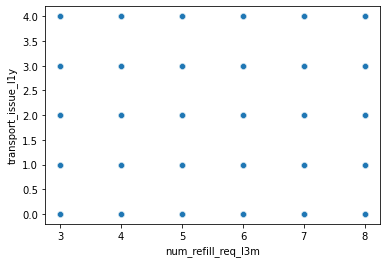

In [32]:
sns.scatterplot(df.num_refill_req_l3m,df.transport_issue_l1y)

C:\Users\srivi\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='num_refill_req_l3m', ylabel='retail_shop_num'>

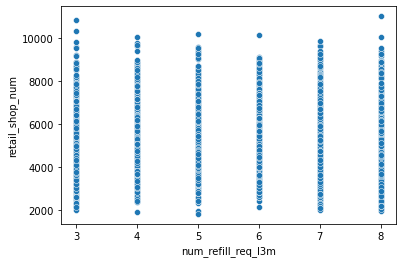

In [33]:
sns.scatterplot(df.num_refill_req_l3m,df.retail_shop_num)

C:\Users\srivi\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='num_refill_req_l3m', ylabel='distributor_num'>

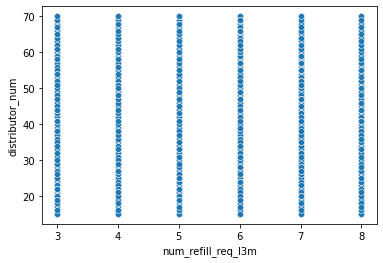

In [34]:
sns.scatterplot(df.num_refill_req_l3m,df.distributor_num)

C:\Users\srivi\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='num_refill_req_l3m', ylabel='flood_impacted'>

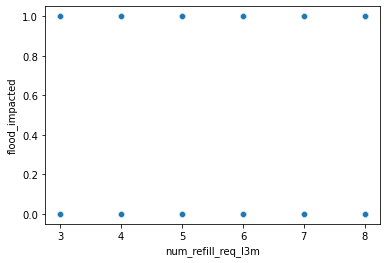

In [35]:
sns.scatterplot(df.num_refill_req_l3m,df.flood_impacted)

C:\Users\srivi\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='num_refill_req_l3m', ylabel='flood_proof'>

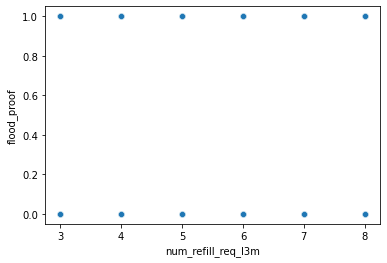

In [36]:
sns.scatterplot(df.num_refill_req_l3m,df.flood_proof)

C:\Users\srivi\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='num_refill_req_l3m', ylabel='electric_supply'>

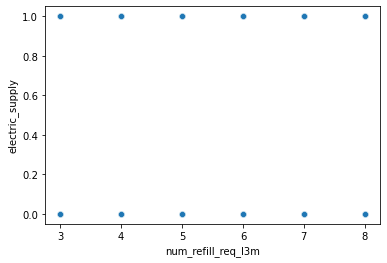

In [37]:
sns.scatterplot(df.num_refill_req_l3m,df.electric_supply)

C:\Users\srivi\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='num_refill_req_l3m', ylabel='dist_from_hub'>

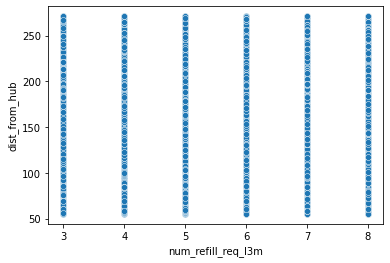

In [38]:
sns.scatterplot(df.num_refill_req_l3m,df.dist_from_hub)

C:\Users\srivi\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='num_refill_req_l3m', ylabel='workers_num'>

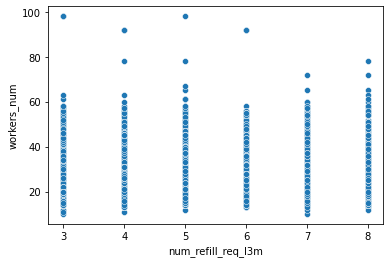

In [39]:
sns.scatterplot(df.num_refill_req_l3m,df.workers_num)

C:\Users\srivi\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='num_refill_req_l3m', ylabel='wh_est_year'>

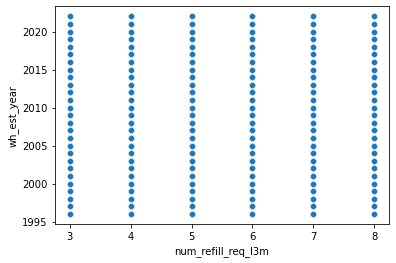

In [40]:
sns.scatterplot(df.num_refill_req_l3m,df.wh_est_year)

C:\Users\srivi\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='num_refill_req_l3m', ylabel='storage_issue_reported_l3m'>

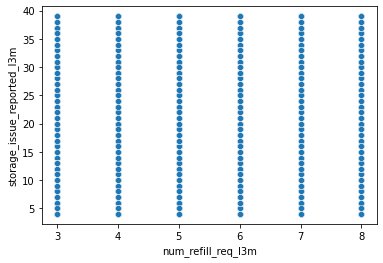

In [41]:
sns.scatterplot(df.num_refill_req_l3m,df.storage_issue_reported_l3m)

C:\Users\srivi\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='num_refill_req_l3m', ylabel='temp_reg_mach'>

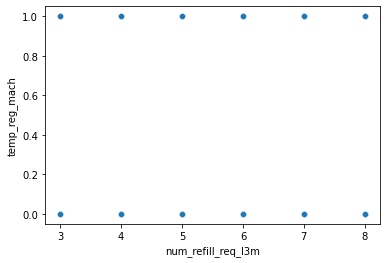

In [42]:
sns.scatterplot(df.num_refill_req_l3m,df.temp_reg_mach)

C:\Users\srivi\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='num_refill_req_l3m', ylabel='wh_breakdown_l3m'>

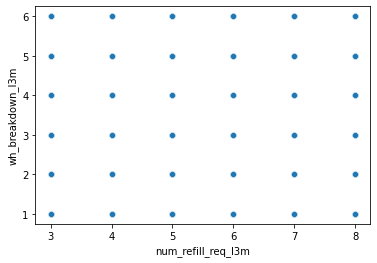

In [43]:
sns.scatterplot(df.num_refill_req_l3m,df.wh_breakdown_l3m)

C:\Users\srivi\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='num_refill_req_l3m', ylabel='govt_check_l3m'>

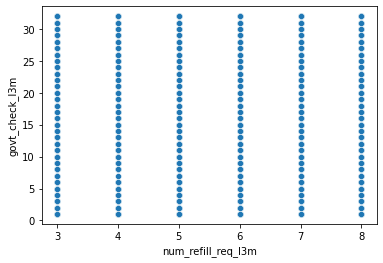

In [44]:
sns.scatterplot(df.num_refill_req_l3m,df.govt_check_l3m)

C:\Users\srivi\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='num_refill_req_l3m', ylabel='product_wg_ton'>

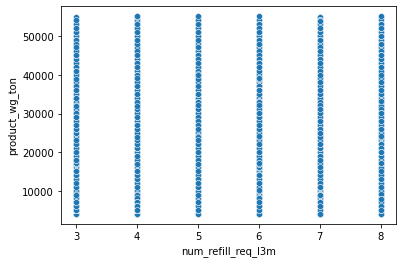

In [45]:
sns.scatterplot(df.num_refill_req_l3m,df.product_wg_ton)

In [46]:
from scipy.stats import skew

In [47]:
df.skew()

num_refill_req_l3m            0.010489
transport_issue_l1y           2.369880
Competitor_in_mkt             1.018088
retail_shop_num               0.941445
distributor_num               0.008325
flood_impacted                2.738501
flood_proof                   4.009471
electric_supply              -0.635651
dist_from_hub                 0.000803
workers_num                   1.094480
wh_est_year                   0.012662
storage_issue_reported_l3m    0.095519
temp_reg_mach                 0.352041
wh_breakdown_l3m              0.064396
govt_check_l3m               -0.380662
product_wg_ton                0.216204
dtype: float64

(array([1702., 1179., 1390., 2029., 2110., 2006.,  844.,  698.,  448.,
         240.]),
 array([ 4062. ,  9170.8, 14279.6, 19388.4, 24497.2, 29606. , 34714.8,
        39823.6, 44932.4, 50041.2, 55150. ]),
 <BarContainer object of 10 artists>)

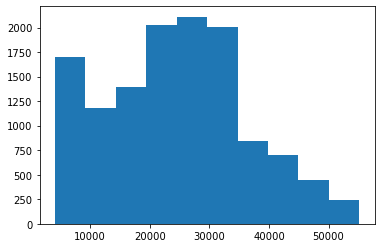

In [48]:
plt.hist(df['product_wg_ton'])

In [49]:
df['workers_num'].fillna(df.mean())

4        25.0
5        35.0
6        27.0
8        22.0
10       37.0
         ... 
24993    33.0
24994    25.0
24995    34.0
24996    28.0
24999    39.0
Name: workers_num, Length: 12646, dtype: float64

In [50]:
df['workers_num'] = df['workers_num'].fillna(df['workers_num'].mean())

In [51]:
df.isnull().sum()

Ware_house_ID                   0
WH_Manager_ID                   0
Location_type                   0
WH_capacity_size                0
zone                            0
WH_regional_zone                0
num_refill_req_l3m              0
transport_issue_l1y             0
Competitor_in_mkt               0
retail_shop_num                 0
wh_owner_type                   0
distributor_num                 0
flood_impacted                  0
flood_proof                     0
electric_supply                 0
dist_from_hub                   0
workers_num                     0
wh_est_year                     0
storage_issue_reported_l3m      0
temp_reg_mach                   0
approved_wh_govt_certificate    0
wh_breakdown_l3m                0
govt_check_l3m                  0
product_wg_ton                  0
dtype: int64

In [52]:
df["Ware_house_ID"]=df['Ware_house_ID'].str.strip('WH_')

In [53]:
df['Location_type']=np.where(df['Location_type'] =='Rural', '1', df['Location_type'])
df['Location_type']=np.where(df['Location_type'] =='Urban', '2', df['Location_type'])

In [54]:
df['WH_capacity_size']=np.where(df['WH_capacity_size'] =='Large', '3', df['WH_capacity_size'])
df['WH_capacity_size']=np.where(df['WH_capacity_size'] =='Mid', '2', df['WH_capacity_size'])
df['WH_capacity_size']=np.where(df['WH_capacity_size'] =='Small', '1', df['WH_capacity_size'])

In [55]:
df['zone']=np.where(df['zone'] =='North', '1', df['zone'])
df['zone']=np.where(df['zone'] =='East', '2', df['zone'])
df['zone']=np.where(df['zone'] =='West', '3', df['zone'])
df['zone']=np.where(df['zone'] =='South', '4', df['zone'])

In [56]:
df['WH_regional_zone']=np.where(df['WH_regional_zone'] =='Zone 1', '1', df['WH_regional_zone'])
df['WH_regional_zone']=np.where(df['WH_regional_zone'] =='Zone 2', '2', df['WH_regional_zone'])
df['WH_regional_zone']=np.where(df['WH_regional_zone'] =='Zone 3', '3', df['WH_regional_zone'])
df['WH_regional_zone']=np.where(df['WH_regional_zone'] =='Zone 4', '4', df['WH_regional_zone'])
df['WH_regional_zone']=np.where(df['WH_regional_zone'] =='Zone 5', '5', df['WH_regional_zone'])
df['WH_regional_zone']=np.where(df['WH_regional_zone'] =='Zone 6', '6', df['WH_regional_zone'])

In [57]:
df['wh_owner_type']=np.where(df['wh_owner_type'] =='Rented', '1', df['wh_owner_type'])
df['wh_owner_type']=np.where(df['wh_owner_type'] =='Company Owned', '2', df['wh_owner_type'])

In [58]:
df['approved_wh_govt_certificate']=np.where(df['approved_wh_govt_certificate'] =='A', '1', df['approved_wh_govt_certificate'])
df['approved_wh_govt_certificate']=np.where(df['approved_wh_govt_certificate'] =='A+', '2', df['approved_wh_govt_certificate'])
df['approved_wh_govt_certificate']=np.where(df['approved_wh_govt_certificate'] =='B', '3', df['approved_wh_govt_certificate'])
df['approved_wh_govt_certificate']=np.where(df['approved_wh_govt_certificate'] =='B+', '4', df['approved_wh_govt_certificate'])
df['approved_wh_govt_certificate']=np.where(df['approved_wh_govt_certificate'] =='C','5', df['approved_wh_govt_certificate'])


In [59]:
df.isnull().sum()

Ware_house_ID                   0
WH_Manager_ID                   0
Location_type                   0
WH_capacity_size                0
zone                            0
WH_regional_zone                0
num_refill_req_l3m              0
transport_issue_l1y             0
Competitor_in_mkt               0
retail_shop_num                 0
wh_owner_type                   0
distributor_num                 0
flood_impacted                  0
flood_proof                     0
electric_supply                 0
dist_from_hub                   0
workers_num                     0
wh_est_year                     0
storage_issue_reported_l3m      0
temp_reg_mach                   0
approved_wh_govt_certificate    0
wh_breakdown_l3m                0
govt_check_l3m                  0
product_wg_ton                  0
dtype: int64

In [60]:
df.head()

,Ware_house_ID,WH_Manager_ID,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,...,electric_supply,dist_from_hub,workers_num,wh_est_year,storage_issue_reported_l3m,temp_reg_mach,approved_wh_govt_certificate,wh_breakdown_l3m,govt_check_l3m,product_wg_ton
4,100004,EID_50004,1,3,1,5,3,1,2,4740,...,1,112,25.0,2009.0,18,0,5,6,24,24071
5,100005,EID_50005,1,1,3,1,8,0,2,5053,...,1,152,35.0,2009.0,23,1,2,3,3,32134
6,100006,EID_50006,1,3,3,6,8,0,4,4449,...,1,77,27.0,2010.0,24,0,3,3,6,30142
8,100008,EID_50008,1,1,4,6,8,1,4,5381,...,1,124,22.0,2013.0,13,1,2,5,2,18082
10,100010,EID_50010,1,3,1,6,7,1,3,4623,...,1,150,37.0,1999.0,17,0,4,4,6,21125


In [61]:
from sklearn import metrics

In [62]:
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.model_selection import cross_val_score

In [63]:
X=df[['Ware_house_ID', 'Location_type', 'WH_capacity_size', 'zone',
       'WH_regional_zone', 'num_refill_req_l3m', 'transport_issue_l1y',
       'Competitor_in_mkt', 'retail_shop_num', 'wh_owner_type',
       'distributor_num', 'flood_impacted', 'flood_proof', 'electric_supply',
       'dist_from_hub', 'workers_num','wh_est_year','temp_reg_mach', 'approved_wh_govt_certificate','wh_breakdown_l3m', 'govt_check_l3m']]
y=df['product_wg_ton']

In [64]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
import statsmodels.api as sm

In [65]:
def cross_val(model):
    pred = cross_val_score(model, X, y, cv=10)
    return pred.mean()

def print_evaluate(true, predicted):  
    mae = metrics.mean_absolute_error(true, predicted)
    mse = metrics.mean_squared_error(true, predicted)
    rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
    r2_square = metrics.r2_score(true, predicted)
    print('MAE:', mae)
    print('MSE:', mse)
    print('RMSE:', rmse)
    print('R2 Square', r2_square)
    print('__________________________________')
    
def evaluate(true, predicted):
    mae = metrics.mean_absolute_error(true, predicted)
    mse = metrics.mean_squared_error(true, predicted)
    rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
    r2_square = metrics.r2_score(true, predicted)
    return mae, mse, rmse, r2_square

In [66]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

pipeline = Pipeline([
    ('std_scalar', StandardScaler())
])

X_train = pipeline.fit_transform(X_train)
X_test = pipeline.transform(X_test)

In [67]:
X.isnull().sum()

Ware_house_ID                   0
Location_type                   0
WH_capacity_size                0
zone                            0
WH_regional_zone                0
num_refill_req_l3m              0
transport_issue_l1y             0
Competitor_in_mkt               0
retail_shop_num                 0
wh_owner_type                   0
distributor_num                 0
flood_impacted                  0
flood_proof                     0
electric_supply                 0
dist_from_hub                   0
workers_num                     0
wh_est_year                     0
temp_reg_mach                   0
approved_wh_govt_certificate    0
wh_breakdown_l3m                0
govt_check_l3m                  0
dtype: int64

In [68]:
from sklearn.linear_model import LinearRegression

lin_reg = LinearRegression(normalize=True)
lin_reg.fit(X_train,y_train)

LinearRegression(normalize=True)

In [69]:
print(lin_reg.intercept_)

24432.312019882425


In [99]:
X.columns

Index(['Ware_house_ID', 'Location_type', 'WH_capacity_size', 'zone',
       'WH_regional_zone', 'num_refill_req_l3m', 'transport_issue_l1y',
       'Competitor_in_mkt', 'retail_shop_num', 'wh_owner_type',
       'distributor_num', 'flood_impacted', 'flood_proof', 'electric_supply',
       'dist_from_hub', 'workers_num', 'wh_est_year', 'temp_reg_mach',
       'approved_wh_govt_certificate', 'wh_breakdown_l3m', 'govt_check_l3m'],
      dtype='object')

In [70]:
coeff_df = pd.DataFrame(lin_reg.coef_, X.columns, columns=['Coefficient'])
coeff_df

,Coefficient
Ware_house_ID,14.262565
Location_type,34.084890
WH_capacity_size,-12.258380
zone,34.332343
WH_regional_zone,34.492109
num_refill_req_l3m,6.063320
transport_issue_l1y,-1026.934133
Competitor_in_mkt,3.719068
retail_shop_num,86.756451
wh_owner_type,21.918797


In [71]:
pred = lin_reg.predict(X_test)

In [72]:
pd.DataFrame({'True Values': y_test, 'Predicted Values': pred}).hvplot.scatter(x='True Values', y='Predicted Values')


:Scatter   [True Values]   (Predicted Values)

In [73]:
pd.DataFrame({'Error Values': (y_test - pred)}).hvplot.kde()

:Distribution   [Error Values]   (Density)

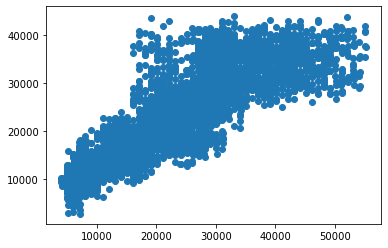

In [165]:
y_pred = lin_reg.predict(X_test)
plt.scatter(y_test, y_pred)

In [89]:
test_pred = lin_reg.predict(X_test)
train_pred = lin_reg.predict(X_train)

print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

results_df = pd.DataFrame(data=[["Linear Regression", *evaluate(y_test, test_pred) , cross_val(LinearRegression())]], 
                          columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', "Cross Validation"])

Test set evaluation:
_____________________________________
MAE: 5052.314638410676
MSE: 43900552.55961637
RMSE: 6625.749207419216
R2 Square 0.6766716149029248
__________________________________
Train set evaluation:
_____________________________________
MAE: 4988.669964483762
MSE: 42205437.3863331
RMSE: 6496.571202283024
R2 Square 0.6816605738529287
__________________________________
0.6766716149029248


In [148]:
R2_linear = lin_reg.score(X_train,y_train)
MSE_linear = MSE(y_test,y_pred)
RMSE_linear = MSE_linear**0.5
print('The R^2 is: {:.3f}' .format(R2_linear))
print('The RMSE is: {:.3f}' .format(RMSE_linear))
MSE_linear

The R^2 is: 0.682
The RMSE is: 6408.270


41065921.068265684

In [132]:
tree = DecisionTreeRegressor(max_depth=5,min_samples_leaf=0.1,
                            random_state=42)
tree.fit(X_train,y_train)
y_pred = tree.predict(X_test)
MSE_cart = MSE(y_test,y_pred)
RMSE_cart = MSE_cart**0.5
print('The RMSE is: {:.3f}' .format(RMSE_cart)) 

test_pred = tree.predict(X_test)
train_pred = tree.predict(X_train)

print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)

print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

results_df_2 = pd.DataFrame(data=[["Decision TreeRegressor", *evaluate(y_test, test_pred), 0]], 
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', 'Cross Validation'])
results_df = results_df.append(results_df_2, ignore_index=True)


The RMSE is: 6525.271
Test set evaluation:
_____________________________________
MAE: 5095.162051151044
MSE: 42579164.701737374
RMSE: 6525.271235874979
R2 Square 0.6864036610222695
__________________________________
Train set evaluation:
_____________________________________
MAE: 5008.395249502274
MSE: 40322828.91284309
RMSE: 6350.025898596248
R2 Square 0.695860367486734
__________________________________


In [168]:
params = {'max_depth':[1,3,5,7,9],
         'min_samples_leaf':[0.02,0.04,0.08,0.12,0.16,0.2]}
gm_cv = GridSearchCV(tree,params,cv=5)
gm_cv.fit(X_train,y_train)
y_pred = gm_cv.predict(X_test)
RMSE_cartgrid = MSE(y_test,y_pred)**0.5
r2_cartgrid=gm_cv.best_score_
print(gm_cv.best_params_)
print('The RMSE is {:.3f}'.format(RMSE_cartgrid))
print('The R^2 is: {:.3f}' .format(r2_cartgrid))

{'max_depth': 5, 'min_samples_leaf': 0.02}
The RMSE is 6200.957
The R^2 is: 0.729


In [90]:
from sklearn.ensemble import RandomForestRegressor

rf_reg = RandomForestRegressor(n_estimators=1000)
rf_reg.fit(X_train, y_train)

test_pred = rf_reg.predict(X_test)
train_pred = rf_reg.predict(X_train)

print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)

print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

results_df_2 = pd.DataFrame(data=[["Random Forest Regressor", *evaluate(y_test, test_pred), 0]], 
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', 'Cross Validation'])
results_df = results_df.append(results_df_2, ignore_index=True)


Test set evaluation:
_____________________________________
MAE: 4719.2181157090145
MSE: 38432019.07255979
RMSE: 6199.356343408547
R2 Square 0.7169474656184297
__________________________________
Train set evaluation:
_____________________________________
MAE: 1709.5081597379121
MSE: 4923235.765967177
RMSE: 2218.836579373789
R2 Square 0.9628659209433466
__________________________________
0.6766716149029248


In [152]:
y_pred = rf_reg.predict(X_test)
RMSE_rf = MSE(y_test,y_pred)**0.5
print('The RMSE is {:.3f}'.format(RMSE_rf))

The RMSE is 6199.356


In [166]:
params = {'max_depth':[3,5,7,9,11,13],
         'min_samples_leaf':[0.02,0.04,0.08,0.12,0.16,0.2],
         'n_estimators':[100,250,500,1000]}
gm_cv = GridSearchCV(rf_reg,params,cv=3)
gm_cv.fit(X_train,y_train)
y_pred = gm_cv.predict(X_test)
print(gm_cv.best_params_)
RMSE_rfgrid = MSE(y_test,y_pred)**0.5
r2_rfgrid= gm_cv.best_score_
print('The RMSE is {:.3f}'.format(RMSE_rfgrid))
print('The R^2 is: {:.3f}' .format(r2_rfgrid))

{'max_depth': 11, 'min_samples_leaf': 0.02, 'n_estimators': 250}
The RMSE is 6203.500
The R^2 is: 0.727


In [76]:
from sklearn.linear_model import SGDRegressor

sgd_reg = SGDRegressor(n_iter_no_change=250, penalty=None, eta0=0.0001, max_iter=100000)
sgd_reg.fit(X_train, y_train)

test_pred = sgd_reg.predict(X_test)
train_pred = sgd_reg.predict(X_train)

print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)
print('====================================')
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

results_df_2 = pd.DataFrame(data=[["Stochastic Gradient Descent", *evaluate(y_test, test_pred), 0]], 
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', 'Cross Validation'])
results_df = results_df.append(results_df_2, ignore_index=True)


Test set evaluation:
_____________________________________
MAE: 5052.314895411222
MSE: 43900562.01706861
RMSE: 6625.749921108449
R2 Square 0.6766715452486134
__________________________________
Train set evaluation:
_____________________________________
MAE: 4988.669858681876
MSE: 42205437.38752629
RMSE: 6496.5712023748565
R2 Square 0.6816605738439289
__________________________________


In [162]:
from sklearn.linear_model import Ridge

model = Ridge(alpha=100, solver='cholesky', tol=0.0001, random_state=42)
model.fit(X_train, y_train)
pred = model.predict(X_test)

test_pred = model.predict(X_test)
train_pred = model.predict(X_train)

print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)
print('====================================')
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

results_df_2 = pd.DataFrame(data=[["Ridge Regression", *evaluate(y_test, test_pred) , cross_val(Ridge())]], 
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', "Cross Validation"])
results_df = results_df.append(results_df_2, ignore_index=True)

Test set evaluation:
_____________________________________
MAE: 5056.903654017159
MSE: 43928981.79396916
RMSE: 6627.894220185561
R2 Square 0.6764622330638159
__________________________________
Train set evaluation:
_____________________________________
MAE: 4994.426986821153
MSE: 42217135.75176387
RMSE: 6497.471489107426
R2 Square 0.6815723375694374
__________________________________


In [163]:
pipeline = Pipeline([('scaler',StandardScaler()),('ridge',Ridge())])
params = {'ridge__alpha':[0.001,0.003,0.01,0.03,0.1,0.3,1,3,10,30,100]}
gm_cv = GridSearchCV(pipeline,params,cv=5)
gm_cv.fit(X_train,y_train)
y_pred = gm_cv.predict(X_test)
MSE_ridge = MSE(y_test,y_pred)
RMSE_ridge = MSE_ridge**0.5
R2_ridge = gm_cv.best_score_
print(gm_cv.best_params_)
print('The R^2 is: {:.3f}' .format(R2_ridge))
print('The RMSE is: {:.3f}' .format(RMSE_ridge))  

{'ridge__alpha': 10}
The R^2 is: 0.679
The RMSE is: 6625.885


In [158]:
from sklearn.linear_model import Lasso

model = Lasso(alpha=0.1, 
              precompute=True, 
#               warm_start=True, 
              positive=True, 
              selection='random',
              random_state=42)
model.fit(X_train, y_train)

test_pred = model.predict(X_test)
train_pred = model.predict(X_train)

print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)
print('====================================')
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

results_df_2 = pd.DataFrame(data=[["Lasso Regression", *evaluate(y_test, test_pred) , cross_val(Lasso())]], 
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', "Cross Validation"])
results_df = results_df.append(results_df_2, ignore_index=True)

Test set evaluation:
_____________________________________
MAE: 9102.753138279495
MSE: 125328989.06005734
RMSE: 11195.043057534765
R2 Square 0.07694966746469933
__________________________________
Train set evaluation:
_____________________________________
MAE: 8986.667038069489
MSE: 121216071.7325045
RMSE: 11009.817061718351
R2 Square 0.08571366381282453
__________________________________


In [161]:
steps = [('scaler', StandardScaler()),
         ('lasso', Lasso())]
pipeline = Pipeline(steps)
params = {'lasso__alpha':[0.001,0.003,0.01,0.03,0.1,0.3,1,3,10,30,100]}
gm_cv = GridSearchCV(pipeline, params,cv=5)
gm_cv.fit(X_train,y_train)
#optimal hyperparameter
print(gm_cv.best_params_)
y_pred = gm_cv.predict(X_test)
MSE_lasso = MSE(y_test,y_pred)
RMSE_lasso = MSE_lasso**0.5
R2_lasso = gm_cv.best_score_
print('The R^2 is: {:.3f}' .format(R2_lasso))
print('The RMSE is: {:.3f}' .format(RMSE_lasso))

{'lasso__alpha': 100}
The R^2 is: 0.680
The RMSE is: 6623.298


In [135]:
boost = AdaBoostRegressor(base_estimator=DecisionTreeRegressor(),
                          n_estimators=200,random_state=42)
boost.fit(X_train,y_train)
y_pred = boost.predict(X_test)
RMSE_adab = MSE(y_test,y_pred)**0.5
print('The RMSE is {:.3f}'.format(RMSE_adab))
test_pred = boost.predict(X_test)
train_pred = boost.predict(X_train)

print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)
print('====================================')
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

results_df_2 = pd.DataFrame(data=[["AdaBoostRegressor", *evaluate(y_test, test_pred) , cross_val(AdaBoostRegressor())]], 
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', "Cross Validation"])
results_df = results_df.append(results_df_2, ignore_index=True)

The RMSE is 6362.823
Test set evaluation:
_____________________________________
MAE: 4705.179230363732
MSE: 40485522.364786506
RMSE: 6362.823458558826
R2 Square 0.7018233757253571
__________________________________
Train set evaluation:
_____________________________________
MAE: 85.75655219159512
MSE: 115082.32749661093
RMSE: 339.2378627108285
R2 Square 0.9991319781439629
__________________________________


In [169]:
param_dist = {
 'n_estimators': [100,200,500],
 'learning_rate' : [0.01,0.05,0.1,0.3,1],
 'loss' : ['linear', 'square', 'exponential']
 }
rs_cv = RandomizedSearchCV(boost,param_dist,cv=3) #in order to decrease running time, i used randomizedsearchcv here instead of gridsearch
rs_cv.fit(X_train,y_train)
y_pred = rs_cv.predict(X_test)
RMSE_adagrid = MSE(y_test,y_pred)**0.5
r2_adagrid=gm_cv.best_score_
print(rs_cv.best_params_)
print('The RMSE is {:.3f}'.format(RMSE_adagrid))
print('The R^2 is: {:.3f}' .format(r2_adagrid))

{'n_estimators': 500, 'loss': 'exponential', 'learning_rate': 0.01}
The RMSE is 6391.202
The R^2 is: 0.729


In [143]:
results_df

,MAE,MSE,RMSE,R2 Square,Cross Validation
Model,,,,,
NaN,5052.314638,4.390055e+07,6625.749207,0.676672,0.679017
NaN,4719.218116,3.843202e+07,6199.356343,0.716947,0.000000
NaN,5095.162051,4.257916e+07,6525.271236,0.686404,0.000000
AdaBoostRegressor,4705.179230,4.048552e+07,6362.823459,0.701823,0.712283
AdaBoostRegressor,4705.179230,4.048552e+07,6362.823459,0.701823,0.712476


<AxesSubplot:xlabel='product_wg_ton'>

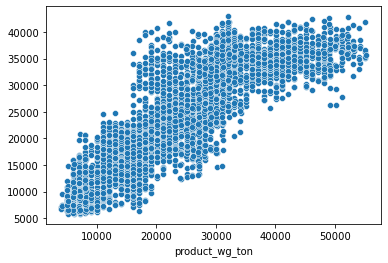

In [109]:
y_pred = rf_reg.predict(X_test)
sns.scatterplot(y_test, y_pred)

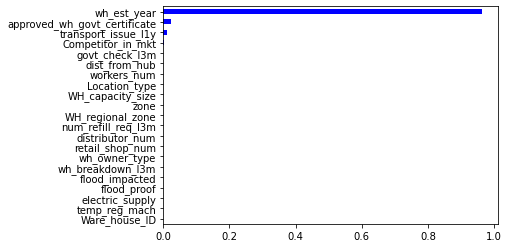

<Figure size 2880x1152 with 0 Axes>

In [175]:
best_model = gm_cv.best_estimator_
best_model.feature_importances_
importances = pd.Series(best_model.feature_importances_,index=X.columns)
importances_sorted = importances.sort_values()
importances_sorted.plot(kind='barh', color='blue')
plt.figure(figsize=(40, 16))
plt.show()

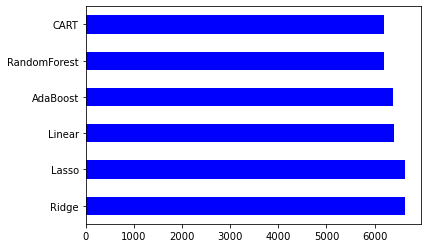

In [170]:
model = ["Linear","Lasso","Ridge","CART","RandomForest","AdaBoost"]
RMSE = [RMSE_linear,RMSE_lasso,RMSE_ridge,RMSE_cartgrid,RMSE_rfgrid,RMSE_adagrid]
rmseseries = pd.Series(RMSE,index=model)
rmseseries_sorted = rmseseries.sort_values(ascending=True) 
rmseseries_sorted.plot(kind="barh",color="blue").invert_yaxis()